In [1]:
from pipeline_prompt2prompt import Prompt2PromptPipeline
from ptp_utils import AttentionStore, AttentionReplace, LocalBlend, AttentionRefine, AttentionReweight, view_images, get_equalizer
import torch
import numpy as np

A matching Triton is not available, some optimizations will not be enabled.
Error caught was: module 'triton.language' has no attribute 'constexpr'


Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

/home/tiger/anaconda3/lib/python3.9/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/20 [00:00<?, ?it/s]

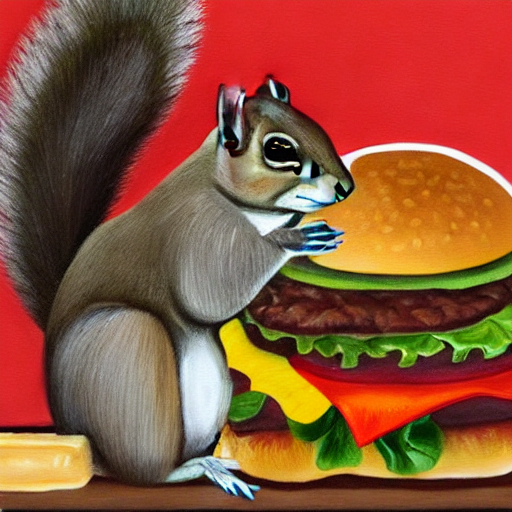

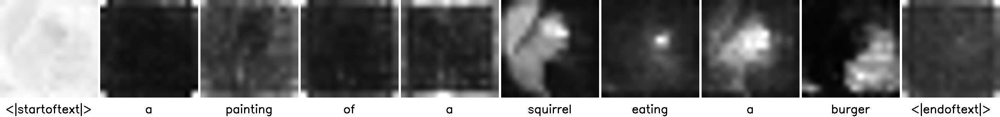

In [2]:
# demo to show cross attention by controller
g_cpu = torch.Generator().manual_seed(2333)
prompts = ["A painting of a squirrel eating a burger"]
controller = AttentionStore()
device = "cuda"

pipe = Prompt2PromptPipeline.from_pretrained("CompVis/stable-diffusion-v1-4" ).to(device)

# run on prompt
outputs = pipe(prompt=prompts, height=512, width=512, num_inference_steps=20,
                controller=controller, generator=g_cpu,)
view_images( [np.array(img) for img in outputs.images] )
pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=0) # run only after inference once. the controller must be update to get the cross-attn map.

### Replacement edit

  0%|          | 0/20 [00:00<?, ?it/s]

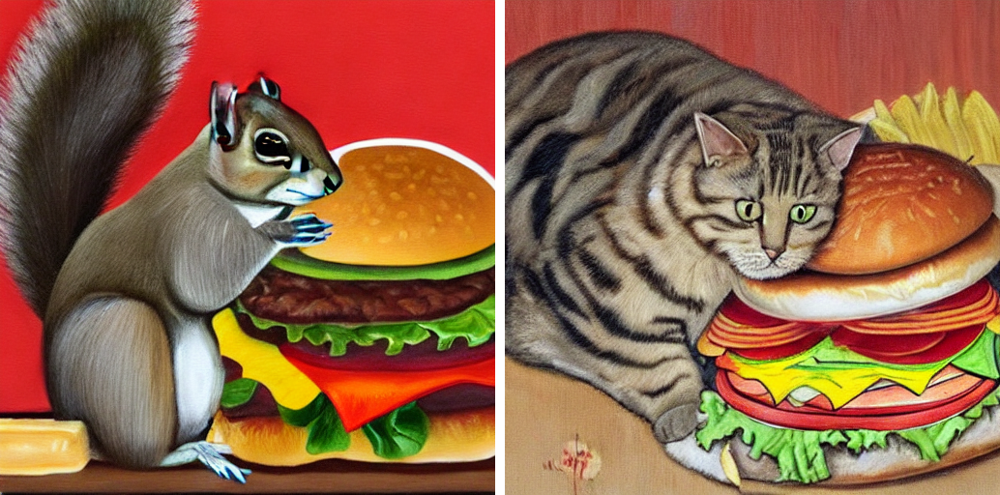

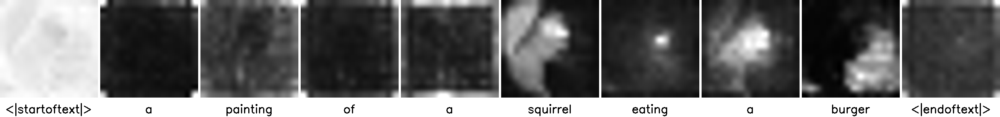

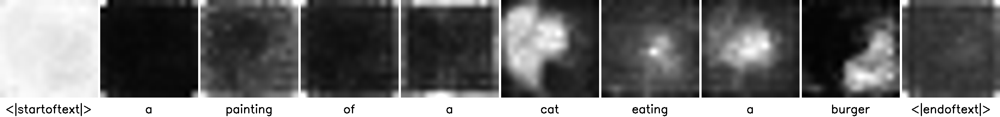

In [3]:
g_cpu = torch.Generator().manual_seed(2333)
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a cat eating a burger"]

NUM_DIFFUSION_STEPS = 20

# cross_replace_steps: specifies the fraction of steps to edit the cross attention maps. Can also be set to a dictionary [str:float] which specifies fractions for different words in the prompt.
# cross_replace_steps=0., self_replace_steps=0. means no replacement and generate a new image from scratch. you can lose the restirction by reducing the fraction.
# eg. cross_replace_steps={"default_": 1., "cat": .4} 
# self_replace_steps: specifies the fraction of steps to replace the self attention maps.

controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=0.4, self_replace_steps=0.4, tokenizer=pipe.tokenizer, device=pipe.device)
outputs = pipe(prompt=prompts, height=512, width=512, num_inference_steps=NUM_DIFFUSION_STEPS,
                controller=controller, generator=g_cpu,)
view_images( [np.array(img) for img in outputs.images] )

pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=0)
pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=1)


## Replacement edit with local blend

  0%|          | 0/20 [00:00<?, ?it/s]

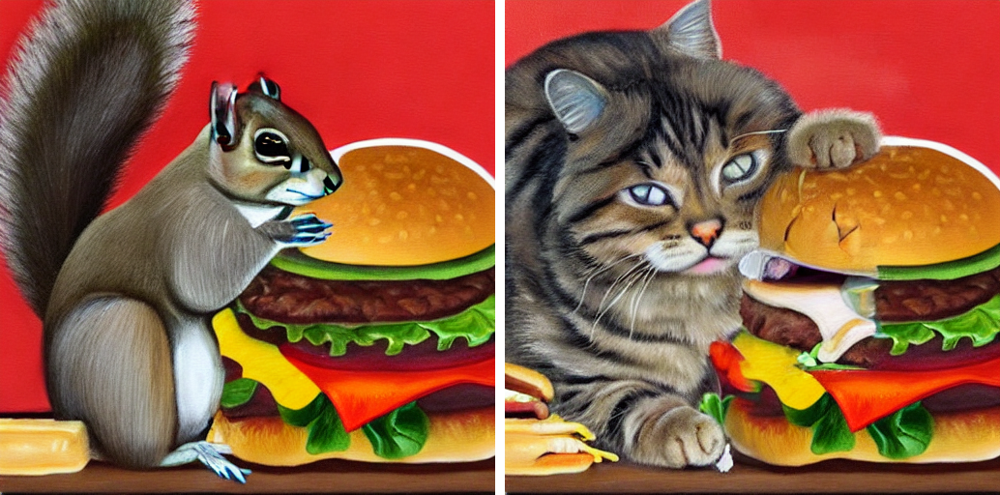

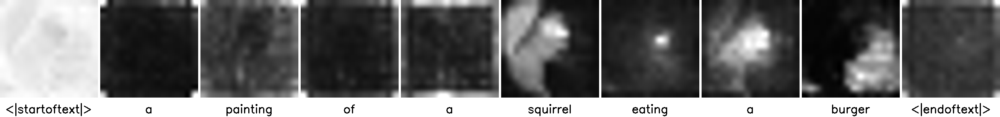

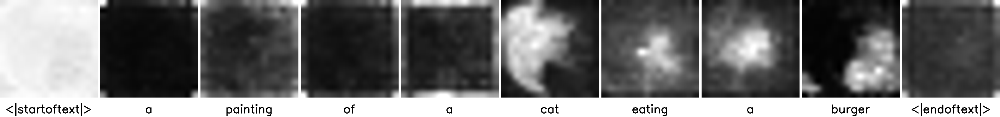

In [4]:
g_cpu = torch.Generator().manual_seed(2333)
prompts = ["A painting of a squirrel eating a burger",
           "A painting of a cat eating a burger"]
from ptp_utils import AttentionReplace, LocalBlend, view_images

NUM_DIFFUSION_STEPS = 20
lb = LocalBlend(prompts, ("squirrel", "cat"), tokenizer=pipe.tokenizer, device=pipe.device)
controller = AttentionReplace(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.4, self_replace_steps=0.4, tokenizer=pipe.tokenizer, device=pipe.device, local_blend=lb)
outputs = pipe(prompt=prompts, height=512, width=512, num_inference_steps=NUM_DIFFUSION_STEPS,
                controller=controller, generator=g_cpu,)
view_images( [np.array(img) for img in outputs.images] )

pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=0)
pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=1)

## Refinement edit

  0%|          | 0/20 [00:00<?, ?it/s]

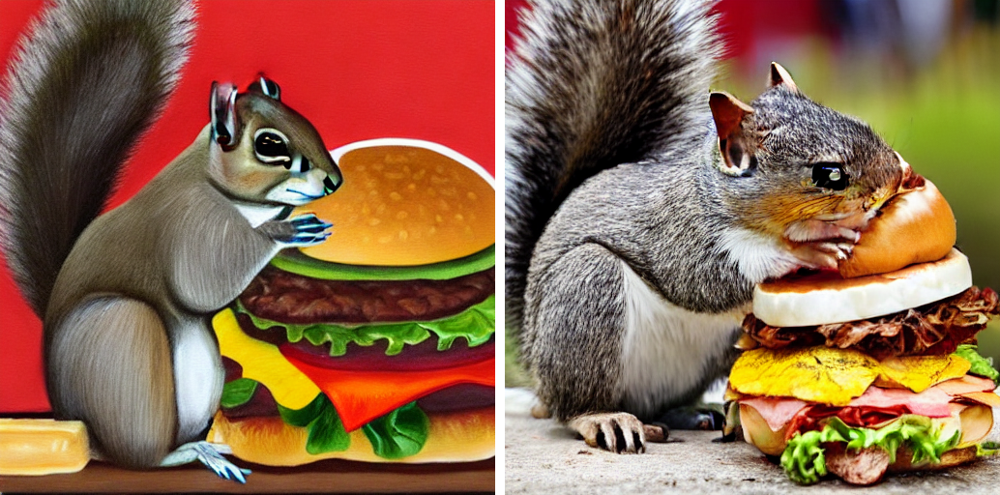

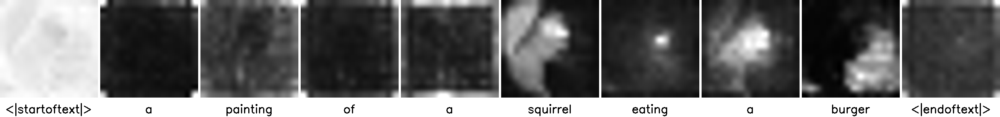

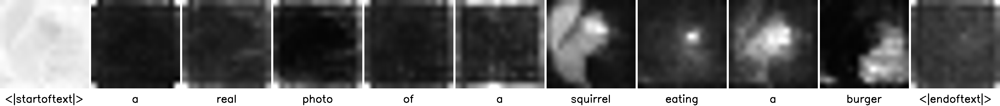

In [5]:
g_cpu = torch.Generator().manual_seed(2333)
prompts = ["A painting of a squirrel eating a burger",
           "A real photo of a squirrel eating a burger"]

NUM_DIFFUSION_STEPS = 20
# lb = LocalBlend(prompts, ("squirrel", "squirrel"),tokenizer=pipe.tokenizer, device=pipe.device)   # only change the local squirrel
controller = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, 
                            cross_replace_steps=.9,
                            self_replace_steps=.2,
                            tokenizer=pipe.tokenizer,
                            device=pipe.device,)
outputs = pipe(prompt=prompts, height=512, width=512, num_inference_steps=NUM_DIFFUSION_STEPS,
                controller=controller, generator=g_cpu,)
view_images( [np.array(img) for img in outputs.images] )
pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=0)
pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=1)

## Re-weighting

  0%|          | 0/20 [00:00<?, ?it/s]

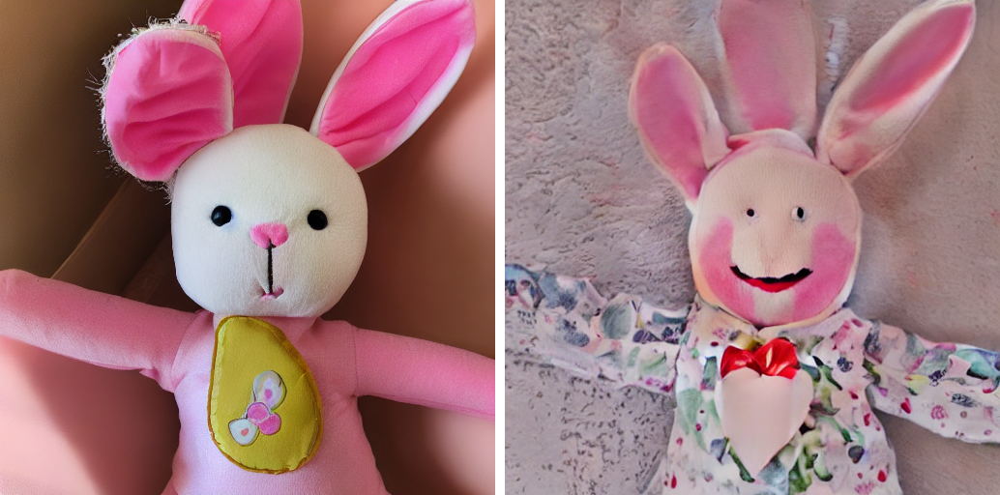

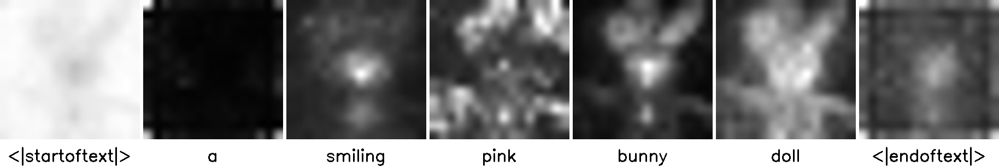

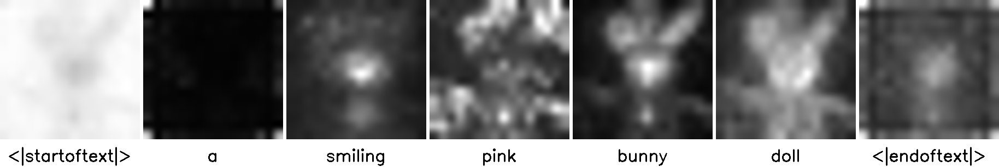

In [6]:
g_cpu = torch.Generator().manual_seed(2333)

prompts = ["a smiling pink bunny doll"] * 2
NUM_DIFFUSION_STEPS = 20

### pay less attention to the word "pink"
equalizer = get_equalizer(prompts[1], ("smiling",), (5,), tokenizer=pipe.tokenizer)

controller = AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                                self_replace_steps=.8,tokenizer=pipe.tokenizer,
                                device=pipe.device,
                                equalizer=equalizer,)
outputs = pipe(prompt=prompts, height=512, width=512, num_inference_steps=NUM_DIFFUSION_STEPS,
                controller=controller, generator=g_cpu,)
view_images( [np.array(img) for img in outputs.images] )
pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=0)
pipe.show_cross_attention(prompts, controller, res=16, from_where=("up", "down"), select=1)

## Multiple Controller (replace&refine + reweight)

  0%|          | 0/20 [00:00<?, ?it/s]

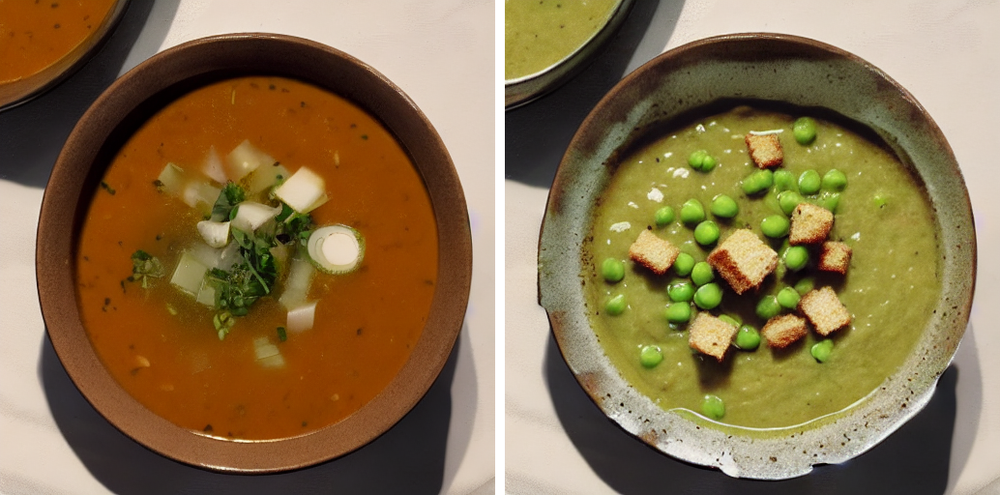

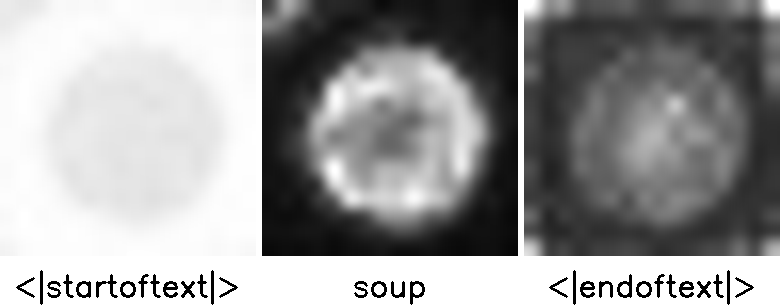

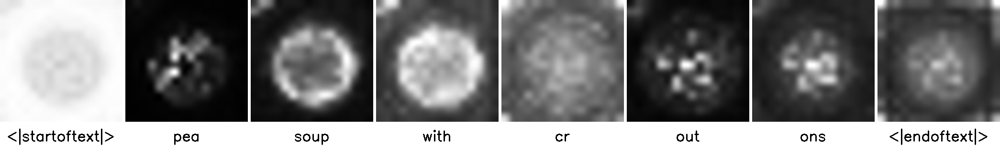

In [7]:
g_cpu = torch.Generator().manual_seed(2333)
NUM_DIFFUSION_STEPS = 20

prompts = ["soup",
           "pea soup with croutons"] 
lb = LocalBlend(prompts, ("soup", "soup"), tokenizer=pipe.tokenizer, device=pipe.device)

controller_a = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.2,
                            self_replace_steps=.4, local_blend=lb, tokenizer=pipe.tokenizer,
                            device=pipe.device)

outputs = pipe(prompt=prompts, height=512, width=512, num_inference_steps=NUM_DIFFUSION_STEPS,
                controller=controller_a, generator=g_cpu,)                          
view_images( [np.array(img) for img in outputs.images] )
pipe.show_cross_attention(prompts, controller_a, res=16, from_where=("up", "down"), select=0)
pipe.show_cross_attention(prompts, controller_a, res=16, from_where=("up", "down"), select=1)


## add more croutons

  0%|          | 0/20 [00:00<?, ?it/s]

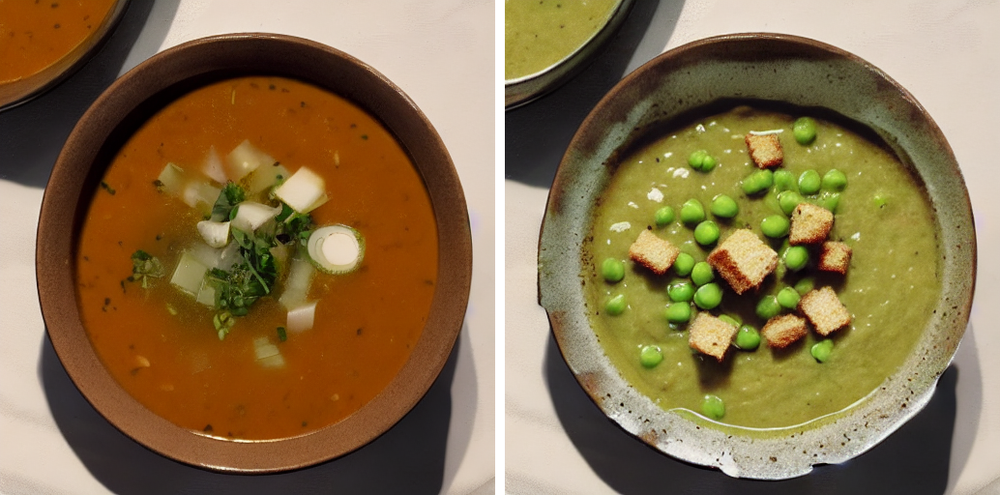

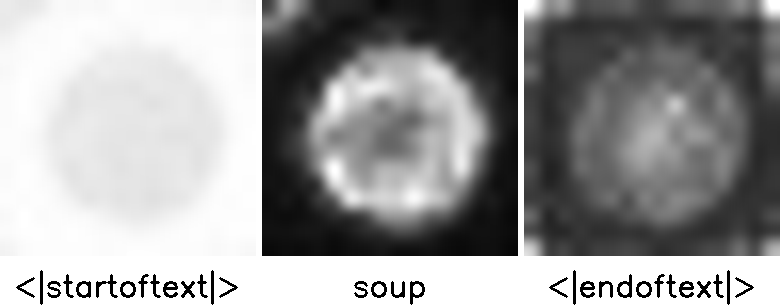

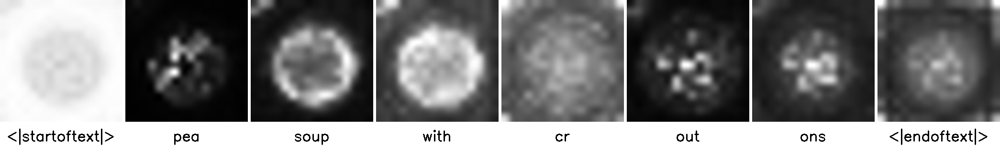

In [8]:
g_cpu = torch.Generator().manual_seed(2333)
NUM_DIFFUSION_STEPS = 20

prompts = ["soup",
           "pea soup with croutons"] 
lb = LocalBlend(prompts, ("soup", "soup"), tokenizer=pipe.tokenizer, device=pipe.device)

controller_a = AttentionRefine(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.2,
                            self_replace_steps=.4, local_blend=lb, tokenizer=pipe.tokenizer,
                            device=pipe.device)
# add more croutons
equalizer = get_equalizer(prompts[1], ("croutons",), (5,), tokenizer=pipe.tokenizer)
AttentionReweight(prompts, NUM_DIFFUSION_STEPS, cross_replace_steps=.8,
                            self_replace_steps=.4, equalizer=equalizer, local_blend=lb,
                            controller=controller_a, tokenizer=pipe.tokenizer,
                            device=pipe.device)
outputs = pipe(prompt=prompts, height=512, width=512, num_inference_steps=NUM_DIFFUSION_STEPS,
                controller=controller_a, generator=g_cpu,)                          
view_images( [np.array(img) for img in outputs.images] )
pipe.show_cross_attention(prompts, controller_a, res=16, from_where=("up", "down"), select=0)
pipe.show_cross_attention(prompts, controller_a, res=16, from_where=("up", "down"), select=1)

